<center> <h1> M1. Actividad Simulación robot de limpieza </h1> </center>

<center> Abraham Chalita Núñez - A01653879 </center>

> <font size = "4.5"> **Objetivo:** Desarrollar con base a distintas herramientas, una simulación de un sistema multiagente basado en un robot de limpieza reactivo. Se busca poder analizar las estadísticas generales en relación con el comportamiento que se llegue a obtener. </font>


<font size = "3"> Para el desarrollo del sistema principal se tomó en cuenta que se buscaba simular un ambiente en donde un robot de limpieza tiene la tarea de limpiar las celdas que se encuentren sucia a través de ciertas acciones disponibles. Considerando lo anterior, se consideraron los siguientes parámetros iniciales para la construcción del SMA: </font>

            > Una habitación de M x N espacios
            > Número n de agentes
            > Porcentaje de celdas inicialmente sucias
            > Tiempo máximo de ejecución (Steps)

<font size = "3"> De la misma forma, para construir la simulación se tomaron en cuenta las siguientes consideraciones: </font>

            > Se inicializan las celdas sucias en ubicaciones aleatorias con base al porcentaje establecido
            > Todos los agentes o robots de limpieza comienzan en la celda (1,1)
            > En cada paso, para los agentes:
                    - Si la celda actual está sucia, esta se limpia
                    - Si la celda está limpia, el agente (robot) escoje una dirección aleatoria para moverse
            > Se ejecuta el tiempo máximo establecido

<font size = "3"> Así, considerando todo lo anterior y previo a la construcción del sistema a través de código, parece pertinente establecer ciertos puntos que permitan tener un entendimiento más sólido y dirigido conforme a los agentes y al sistema:

> <font size = "4"> **1. Clasificación de ambiente** </font>


| Ambiente | Observable | Agentes | Clasificación/Estado
| :---: | :---: | :---: | :---: |
| Robot | Parcialmente | Multi-agente | Stochastic/Dinámico

En este caso y conforme a la información disponible se puede decir que el ambiente, para el sistema, en este caso es parcialmente observable, pues el robot únicamente es capaz de observar el estado de la celda en la que se encuentra y no tiene conocimiento del estado de las demás celdas y los cambios por los que han pasado. De la misma forma, podemos decir que el sistema presenta tener un tipo de ambiente estocástico, pues el comportamiento es no determinista, puesto que el estado subsiguiente del sistema se determina en términos de probabilidades o en otras palabras, se determina "tanto por las acciones predecibles del proceso, como por los elementos aleatorios" (Wikipedia, 2022). Lo anterior es fácilmente observable conforme a las consideraciones iniciales que plantean que un robot, al estar en una casilla limpia, su siguiente movimiento es de naturaleza aleatoria, teniendo así, al final variables aleatorias que caracterizan al modelo. Asimismo, se puede decir que el entorno también entraría en la clasificación de dinámico, pues el entorno, o en este caso las casillas sí pueden cambiar mientras el agente delibera en un paso (una casilla puede ser limpiada por otro agente robot)

Posteriormente, también es preciso mencionar que como propiedad, podemos decir que el entorno o ambiente entraría a una categoría episódica, pues existe una división de episodios atómicos independientes, donde cada episodio consiste en la percepción del agente o en este caso del robot y la realización de una acción posterior con base a lo percibido. Además, con base a lo descrito anteriormente, se agrega que el entorno es multiagente, ya que es los estados, existen diversos agentes interactuando con el entorno.


> <font size = "4"> **2. Estructura de los agentes** </font>

Como se estableció anteriormente, se busca establecer una simulación de un sistema multiagente basado en un robot de limpieza reactivo. La propia descripción del objetivo permite establecer la clasificación del agente en cuestión. En este caso los robots son de tipo reactivos simples, ya que las "decisiones" o acciones del agente son realizadas basadas únicamente en el precepto actual, el cual no depende del historial de preceptos. El robot actuará basado en sus reglas predefinidas, que en este caso son verificar si la celda actual esta sucia para limpiarla, y si ya está limpia, moverse.

Así, se establece lo siguiente:

- **El precepto inicial de cada robot es su primera posición**
- **Para cada paso posterior el precepto será únicamente el status de la celda en la que se encuentre, ya que a partir de este se realizaran las acciones**

Vale la pena mencionar que para este caso y basado en la librería utilizada de AgentPy, lo más conveniente resultó ser el establecer a la basura como un agente. Lo anterior permite agregar dichos agentes "basura" al ambiente y asignarles un precepto de su condición, que en este caso es el estar sucios. En la simulación y construcción del código los números representan: 

        > 0 -> agente robot
        > 1 -> Suciedad
        > 2 -> Limpio

También se puede establecer que el precepto inicial y para cada paso de las basuras, es su condicion, la cual puede ser limpia o sucia, aunque esto no represente pertinente en cuanto al desarrollo de sus acciones, pues estos no realizan ninguna.

> <font size = "4"> **3. Construcción de la simulación** </font>


Para comenzar, se importan todas las librerías necesarias para realizar el análisis y construcción de la simulación. Como se estableció anteriormente, se utilizará AgentPy como librería principal de representación de modelado basado en agentes, además de librerías adicionales que permitirán graficar y visualizar los datos de mejor manera:

In [1]:
import agentpy as ap                                                                    # Libreria para el desarrollo y analisis de modelos basados en agentes
import pandas as pandas                                                                 # Libreria para el manejo de datos                   
import matplotlib.pyplot as plt                                                         # Libreria para la visualizacion de datos
from matplotlib.offsetbox import AnchoredText                                           # Libreria para la visualizacion de datos, dentro de la grafica (matplot)         
import seaborn as sns                                                                   # Libreria para la visualizacion de datos
import IPython                                                                          # Libreria para la visualizacion de datos         
import random                                                                           # Libreria para la generacion de numeros aleatorios    

plt.rcParams['animation.embed_limit'] = 2**128                                         # Aumenta el limite de la animacion

movesCount = 0      
movesCountTotal = 0 # Contador de movimientos

- Se establece el agente basura (Trash), el cual en su configuración o setup inicial tiene como precepto su condición inicial, que en este caso siempre será sucio (Sucio = 1)

In [2]:
class trash(ap.Agent):
    
    def setup(self):
        self.condition = 1

- Se establece el agente roomba (robot de limpieza), el cual en su setup presenta su condición de robot (robot = 0), en conjunto de una declaración del area o ambiente. Además, se declaran las acciones disponibles conforme a lo requerido para la simulación.

In [3]:
class roomba(ap.Agent):
    
    def setup(self):
        self.area = self.model.area
        self.condition = 0
        self.moves = 0
        self.timeWhenCompleted = 0
    
    # Funcion para mover el agente en una direccion aleatoria (N, S, E, O)
    def move(self):        
        self.area.move_by(self, random.choice([(0, 1), (0, -1), (1, 0), (-1, 0), (-1, -1), (1, 1), (-1, 1), (1, -1)]))
    
    # Funcion para limpiar la posicion actual del agente
    def clean(self):
        for current in self.area.neighbors(self, 0):
            current.condition = 2
    
    # Funcion para verificar si el agente esta en una posicion con basura
    def checkIfPositionDirty(self):
        for current in self.area.neighbors(self, 0):
            if current.condition == 1:
                return True
            else:
                return False

- Se declara la clase de la simulación o modelo.

In [24]:
class simulation(ap.Model):
    # Funcion para inicializar el modelo, con base en los parametros de entrada, que son: densidad de basura, numero de roombas, numero de pasos y tamaño del area (m x n)
    def setup(self): 
        # Se contabiliza el numero de celdas por limpiar
        cellsToClean = int(self.p['Trash density'] * (self.p.m * self.p.n))
        # Se declara el tamaño del area
        grid = [self.p.m, self.p.n]
        # Se crea el area, especificando que es Toroidal (torus = True)
        self.area = ap.Grid(self, grid, track_empty = True, torus = False)
        
        # Se declaran los conjuntos de agentes basura y roombas
        self.roombas = ap.AgentList(self, self.p['Roomba count'], roomba)
        self.basuras = ap.AgentList(self, cellsToClean, trash)
        
        # Se asigna una posicion aleatoria a cada agente basura y se asigna la posicion (1, 1) a todos los agentes roomba
        self.area.add_agents(self.roombas, [(1,1)] * cellsToClean)
        self.area.add_agents(self.basuras, random = True, empty = True)
        
    # Se declaran las funciones que se ejecutaran en cada paso del modelo
    def step(self):
        
        roombaz = self.roombas
        
        # Para cada paso, si la celda esta sucia, se limpia
        # Si la celda esta limpia, se mueve
        for robot in roombaz:
            if robot.checkIfPositionDirty():
                robot.clean()
            else:
                if len(self.basuras.select(self.basuras.condition == 1)) > 0:
                    global movesCount
                    robot.moves += 1
                    movesCount += 1
                else:
                    global movesCountTotal
                    movesCountTotal += 1
                robot.move()
                
        # Se registra el numero de celdas que quedan por limpiar en cada paso
        self.record('Dirty Squares', len(self.basuras.select(self.basuras.condition == 1)))
        
    def update(self):
        if len(self.basuras.select(self.basuras.condition == 1)) == 0:
            self.end()
        else:
            roombaz = self.roombas
            for x in roombaz:
                x.timeWhenCompleted += 1
    
    
    def end(self):
        print('Simulation ended')
        # Se registra el porcentaje de celdas limpias al finalizar la simulacion
        cleanedCells = len(self.basuras.select(self.basuras.condition == 2))
        dirtyCells = int(self.p['Trash density'] * (self.p.m * self.p.n))
        self.report('Percentaje of cleaned cells', ((dirtyCells - (dirtyCells - cleanedCells)) / (dirtyCells)) * 100)
        
        total = 0
        for robot in self.roombas:
            total += robot.moves
        
        self.report('Total moves', total)
        self.report('Steps', self.roombas[0].timeWhenCompleted - 1)
        self.stop()


    

- Se declaran los parametros iniciales requeridos para la simulación, en donde se incluye:
    - Trash density: porcentaje/densidad de basura que habrá en el tablero
    - M y N, tamaño del tablero
    - steps: numero limite de pasos por simulación
    - Roomba count: número de agentes robot por incluir en la simulación

In [5]:
parameters = {
    'Trash density': 0.6,
    'm': 15,
    'n': 15,
    'steps': 1000,
    'Roomba count': 5,
}

- Conforme a la documentación de la librería, se declara la siguiente función que permite visualizar la simulación del modelo creado

In [6]:
def animation_plot(model, ax):
    attr_grid = model.area.attr_grid('condition')
    # Se declaran los colores que se usaran para representar cada estado de la celda
    color_dict = {0:'#000000', 1:'#E48C1B', 2:'#9EE1EF', None:'#FFFFFF'}
    ap.gridplot(attr_grid, ax=ax, color_dict=color_dict, convert=True)
    ax.set_title(f"Roomba cleaning simulation\n"
                 f"Time-step: {model.t}, Cells left to clean: "
                 f"{len(model.basuras.select(model.basuras.condition == 1))}")
    
fig, ax = plt.subplots() 
model = simulation(parameters)
animation = ap.animate(model, fig, ax, animation_plot)
IPython.display.HTML(animation.to_jshtml(fps=24))

Simulation ended


- Con base a lo registrado en los pasos del modelo y los parametros se crea la visualizaciòn de la grafica de las celdas por limpiar en cada paso de tiempo.

Completed: 1000 stepsSimulation ended

Run time: 0:00:00.047445
Simulation finished


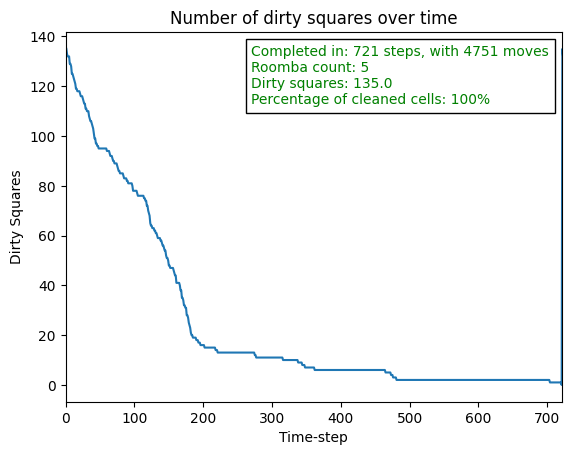

In [7]:
#results.variables.simulation.head()
res = model.run()
data = res.variables.simulation
data.drop(data.tail(1).index, inplace=True)
ax = data.plot()
ax.set_title('Number of dirty squares over time')
ax.get_legend().remove()
ax.set_xlabel('Time-step')
ax.set_ylabel('Dirty Squares')

# En caso de que se llegue a 0, quiere decir que se limpio todo el area y se muestran los resultados, incluyendo el numero de movimientos al completar las celdas, numero de movimientos totales y el porcentaje de celdas limpias
if 0 in data['Dirty Squares'].tolist():
    stepsToComplete = data[data['Dirty Squares'] == 0].index[0]
    totalMoves = parameters['Roomba count'] * parameters['steps']
    text = AnchoredText(f"Completed in: {stepsToComplete} steps, with {movesCount} moves\nRoomba count: {parameters['Roomba count']}\nDirty squares: {parameters['Trash density'] * (parameters['m'] * parameters['n'])} \nPercentage of cleaned cells: 100%", loc='upper right', prop={'color': 'green', 'size': 10})
    ax.add_artist(text)
    ax.set_xlim(0, stepsToComplete)
# En caso de que no se llegue a 0, quiere decir que no se limpio todo el area y se muestran los resultados, incluyendo el numero de movimientos al completar las celdas, numero de movimientos totales y el porcentaje de celdas limpias
else:
    cellsLeft = data['Dirty Squares'].iat[-1]
    totalCells = parameters['Trash density'] * (parameters['m'] * parameters['n'])
    text = AnchoredText(f"Not completed, cleaned: {totalCells - cellsLeft} out of {totalCells}\nPercentage cleaned: {round(((totalCells - cellsLeft)/totalCells) * 100, 3)}% \nMade {movesCount} moves", loc='upper right', prop={'color': 'red', 'size': 10})
    ax.add_artist(text)


In [101]:
parametersExp = {
    'Trash density': 0.6,
    'm': 20,
    'n': 20,
    'steps': 100,
    'Roomba count': 100,
}

sample = ap.Sample(parametersExp, n = 1)

In [102]:
%%capture
exper = ap.Experiment(simulation, sample, iterations=100)
ans = exper.run()

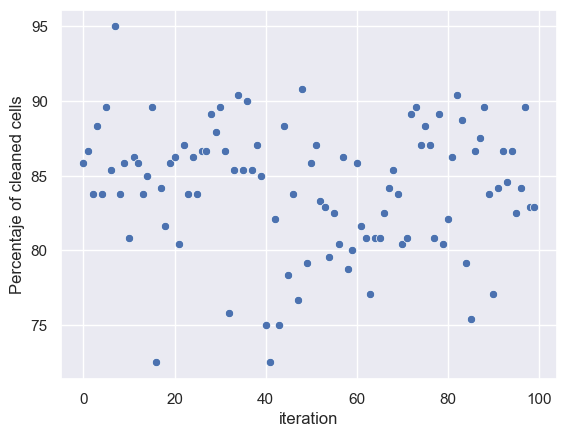

In [103]:
sns.set_theme()
sns.scatterplot(
    data = ans.arrange_reporters(),
    x = 'iteration',
    y = 'Percentaje of cleaned cells',
);

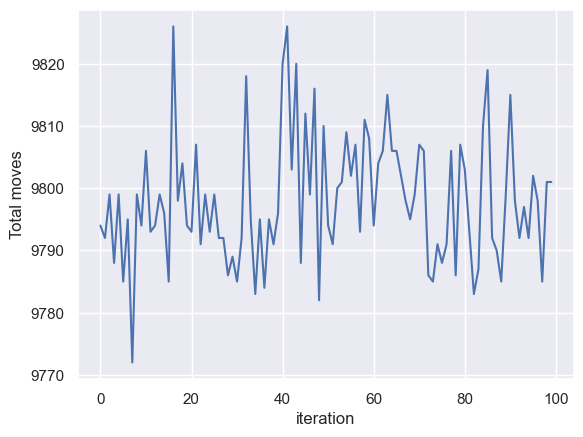

In [104]:
sns.set_theme()
sns.lineplot(
    data = ans.arrange_reporters(),
    x = 'iteration',
    y = 'Total moves',
);

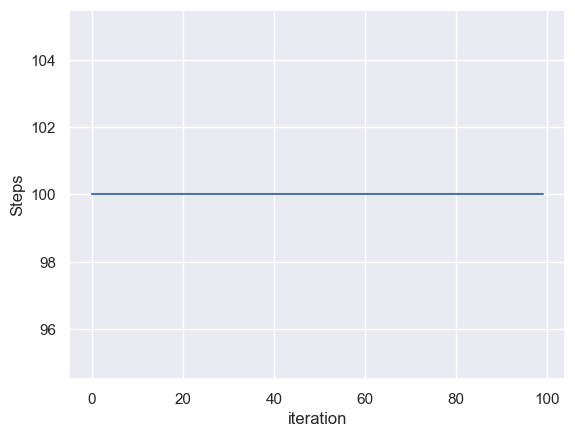

In [105]:
sns.set_theme()
sns.lineplot(
    data = ans.arrange_reporters(),
    x = 'iteration',
    y = 'Steps',
);